<a href="https://colab.research.google.com/github/Tejasri1610/DMAG/blob/main/Visualizing_Temperature_Anomalies_Through_the_Years.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [28]:
from google.colab import files
uploaded = files.upload()

import os
os.listdir()


Saving Cleaned_Global_Temperature.csv to Cleaned_Global_Temperature (2).csv


['.config',
 'Cleaned_Global_Temperature (1).csv',
 'Cleaned_Global_Temperature.csv',
 'Cleaned_Global_Temperature (2).csv',
 'sample_data']

In [29]:
import pandas as pd

df = pd.read_csv('Cleaned_Global_Temperature.csv')
df.head()


,Year,Yearly Anomaly
0,1850,-0.326250
1,1851,-0.215167
2,1852,-0.253500
3,1853,-0.198667
4,1854,-0.093583


In [30]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 174 entries, 0 to 173
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Year            174 non-null    int64  
 1   Yearly Anomaly  174 non-null    float64
dtypes: float64(1), int64(1)
memory usage: 2.8 KB


In [31]:
df['Year'] = pd.to_datetime(df['Year'], format='%Y')

In [36]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

In [37]:
print(df['Year'].head(10))
print(df['Year'].dtypes)

0   1850-01-01
1   1851-01-01
2   1852-01-01
3   1853-01-01
4   1854-01-01
5   1855-01-01
6   1856-01-01
7   1857-01-01
8   1858-01-01
9   1859-01-01
Name: Year, dtype: datetime64[ns]
datetime64[ns]


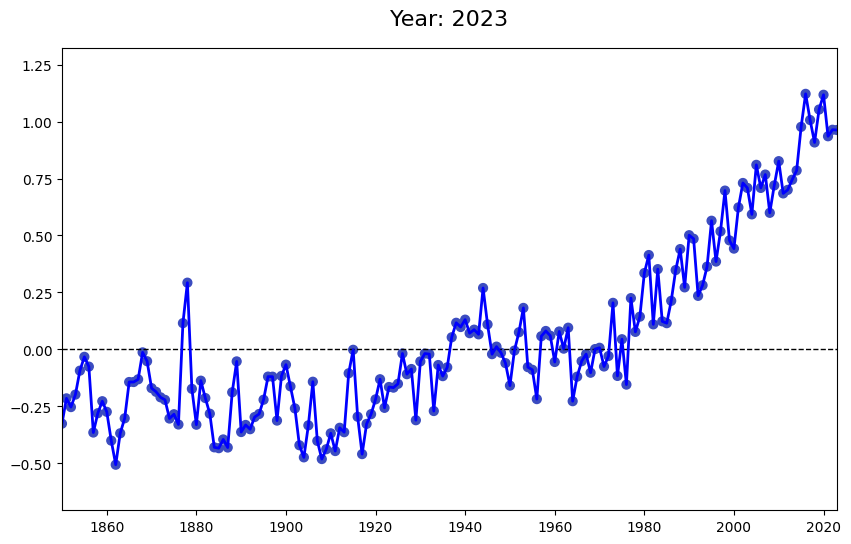

In [38]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

fig, ax = plt.subplots(figsize=(10, 6))
ax.set_xlim(df['Year'].dt.year.min(), df['Year'].dt.year.max())
min_y = df['Yearly Anomaly'].min() - 0.2
max_y = df['Yearly Anomaly'].max() + 0.2
ax.set_ylim(min_y, max_y)
ax.axhline(0, color='black', linestyle='--', linewidth=1)

line, = ax.plot([], [], lw=2, color='blue')
scat = ax.scatter([], [], c=[], cmap='coolwarm', s=40)
title = ax.text(0.5, 1.05, '', transform=ax.transAxes, ha='center', fontsize=16)

def init():
    line.set_data([], [])
    scat.set_offsets(np.empty((0, 2)))
    scat.set_array([])
    title.set_text('')
    return line, scat, title

def animate(i):
    year_data = df.iloc[:i+1]
    years = year_data['Year'].dt.year
    line.set_data(years, year_data['Yearly Anomaly'])
    offsets = np.column_stack((years, year_data['Yearly Anomaly']))
    scat.set_offsets(offsets)
    scat.set_array(year_data['Yearly Anomaly'])
    current_year = years.iloc[-1]
    title.set_text(f"Year: {current_year}")
    return line, scat, title

ani = animation.FuncAnimation(fig, animate, init_func=init, frames=len(df), interval=100, blit=True)
HTML(ani.to_jshtml())


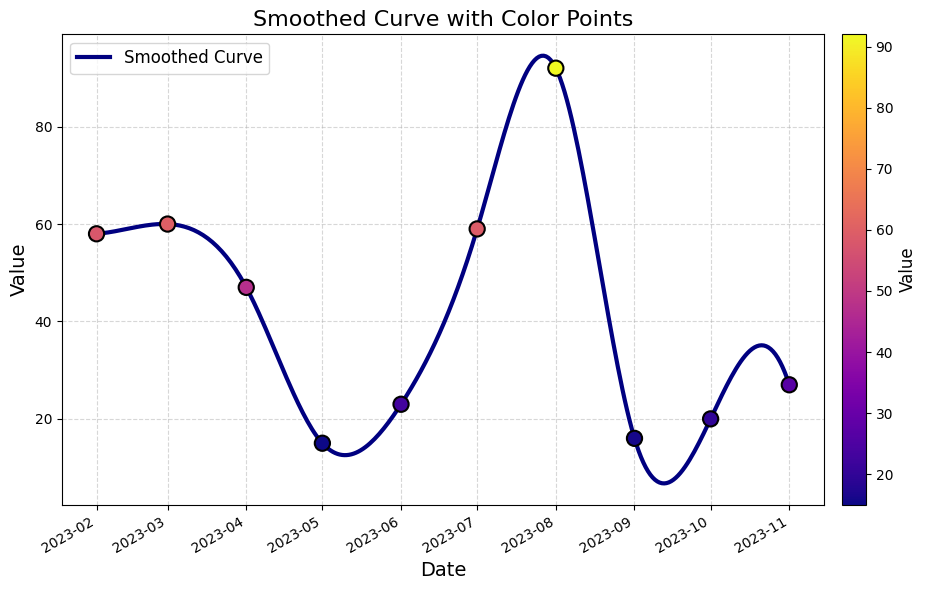

In [54]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.cm as cm
from scipy.interpolate import make_interp_spline
import datetime

dates = ['2023-02-01', '2023-03-01', '2023-04-01', '2023-05-01',
         '2023-06-01', '2023-07-01', '2023-08-01', '2023-09-01',
         '2023-10-01', '2023-11-01']
values = [58, 60, 47, 15, 23, 59, 92, 16, 20, 27]

dates = [datetime.datetime.strptime(d, "%Y-%m-%d") for d in dates]
dates_num = mdates.date2num(dates)

xnew = np.linspace(dates_num.min(), dates_num.max(), 300)
spl = make_interp_spline(dates_num, values, k=3)
ynew = spl(xnew)

fig, ax = plt.subplots(figsize=(10, 6))
sc = ax.scatter(dates_num, values, c=values, cmap='plasma', edgecolors='black', s=120, linewidths=1.5, zorder=5)
ax.plot(mdates.num2date(xnew), ynew, color='navy', linewidth=3, label='Smoothed Curve', zorder=3)

cbar = plt.colorbar(sc, ax=ax, pad=0.02)
cbar.set_label('Value', fontsize=12)
cbar.ax.tick_params(labelsize=10)

ax.legend(loc='upper left', fontsize=12, frameon=True)
ax.grid(True, linestyle='--', alpha=0.5)
ax.set_title('Smoothed Curve with Color Points', fontsize=16)
ax.set_xlabel('Date', fontsize=14)
ax.set_ylabel('Value', fontsize=14)

ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
fig.autofmt_xdate()

plt.tight_layout()
plt.show()
